In [4]:
import numpy as np
from skimage import io, img_as_float
from sklearn.feature_extraction import image
from sklearn.decomposition import MiniBatchDictionaryLearning
import matplotlib.pyplot as plt

# Load the image
image_original = img_as_float(io.imread('lena.png', as_gray=True))



Processing noise level: 0.01


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib

Grid search completed in 431.64 seconds
Best parameters:
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 29.55 dB


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


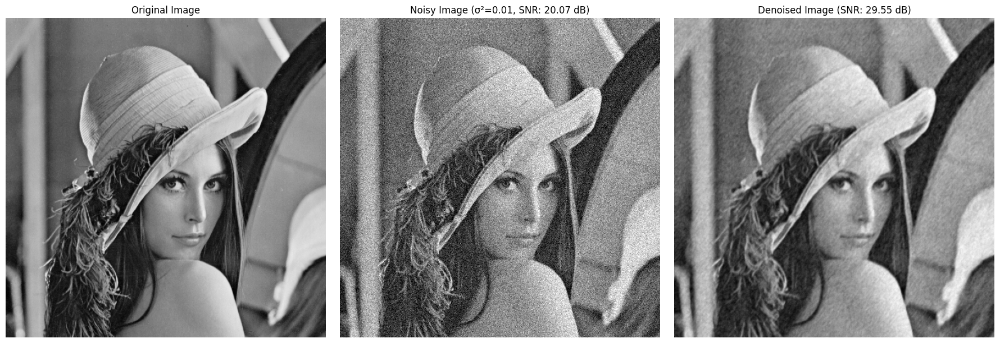


Processing noise level: 0.05


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib

Grid search completed in 346.68 seconds
Best parameters:
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 24.34 dB


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


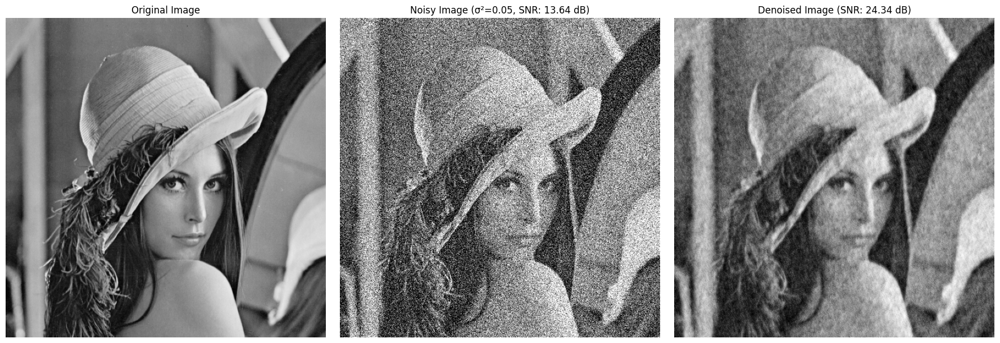


Processing noise level: 0.1


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib

Grid search completed in 241.35 seconds
Best parameters:
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 21.97 dB


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


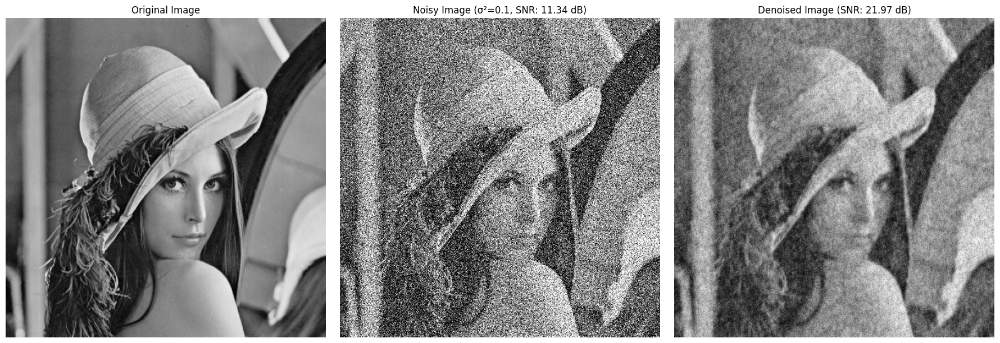


Overall best result:
Noise level: 0.01
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 29.55 dB


In [10]:
import numpy as np
from skimage import io, img_as_float, util
from sklearn.feature_extraction import image
from sklearn.decomposition import DictionaryLearning, MiniBatchDictionaryLearning, NMF
from sklearn.linear_model import orthogonal_mp, Lasso
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio
from joblib import Parallel, delayed
import time

def add_noise(image, noise_type='gaussian', **kwargs):
    if noise_type == 'gaussian':
        return util.random_noise(image, mode='gaussian', **kwargs)
    elif noise_type == 'salt_and_pepper':
        return util.random_noise(image, mode='s&p', **kwargs)
    else:
        raise ValueError("Unsupported noise type")

def extract_patches(image, patch_size):
    patches = util.view_as_windows(image, patch_size)
    return patches.reshape(-1, patch_size[0] * patch_size[1])

def reconstruct_image(patches, image_shape, patch_size):
    return image.reconstruct_from_patches_2d(patches.reshape(-1, *patch_size), image_shape)

def learn_dictionary(patches, method='minibatch', **kwargs):
    if method == 'minibatch':
        learner = MiniBatchDictionaryLearning(**kwargs)
    elif method == 'batch':
        learner = DictionaryLearning(**kwargs)
    elif method == 'nmf':
        nmf_kwargs = {k: v for k, v in kwargs.items() if k != 'transform_algorithm'}
        learner = NMF(**nmf_kwargs)
    else:
        raise ValueError("Unsupported dictionary learning method")
    return learner.fit(patches)

def sparse_code(dictionary, patches, method='omp', **kwargs):
    if method == 'omp':
        n_nonzero_coefs = kwargs.get('n_nonzero_coefs', 3)
        n_nonzero_coefs = min(n_nonzero_coefs, dictionary.shape[0])
        return orthogonal_mp(dictionary.T, patches.T, n_nonzero_coefs=n_nonzero_coefs).T
    elif method == 'lasso':
        alpha = kwargs.get('alpha', 0.1)
        lasso = Lasso(alpha=alpha)
        return np.array([lasso.fit(dictionary.T, patch).coef_ for patch in patches])
    else:
        raise ValueError("Unsupported sparse coding method")

def denoise_image(noisy_image, patch_size, dict_params, sparse_params):
    patches = extract_patches(noisy_image, patch_size)
    
    n_components = dict_params.get('n_components', 100)
    n_components = min(n_components, patches.shape[1])
    dict_params['n_components'] = n_components

    learner = learn_dictionary(patches, **dict_params)
    dictionary = learner.components_

    sparse_codes = sparse_code(dictionary, patches, **sparse_params)

    reconstructed_patches = np.dot(sparse_codes, dictionary)
    denoised_image = reconstruct_image(reconstructed_patches, noisy_image.shape, patch_size)

    return denoised_image

def evaluate_params(noisy_image, image_original, patch_size, dict_params, sparse_params):
    try:
        denoised_image = denoise_image(noisy_image, patch_size, dict_params, sparse_params)
        snr = peak_signal_noise_ratio(image_original, denoised_image)
        return {
            'patch_size': patch_size,
            'dict_params': dict_params,
            'sparse_params': sparse_params,
            'snr': snr
        }
    except Exception as e:
        print(f"Error with parameters: {patch_size}, {dict_params}, {sparse_params}")
        print(f"Error message: {str(e)}")
        return {
            'patch_size': patch_size,
            'dict_params': dict_params,
            'sparse_params': sparse_params,
            'snr': -np.inf
        }

# Load and prepare the image
image_original = img_as_float(io.imread('lena.png', as_gray=True))

# Define parameter grids
patch_sizes = [(6, 6), (8, 8)]
dict_methods = ['minibatch', 'nmf']
n_components_list = [64, 100]
sparse_params_list = [
    {'method': 'omp', 'n_nonzero_coefs': 3},
    {'method': 'lasso', 'alpha': 0.1}
]

# Generate all parameter combinations
param_combinations = [
    (patch_size, {'method': dict_method, 'n_components': n_components}, sparse_params)
    for patch_size in patch_sizes
    for dict_method in dict_methods
    for n_components in n_components_list
    for sparse_params in sparse_params_list
]

noise_levels = [0.01, 0.05, 0.1]  # Different variances for Gaussian noise
all_results = []

for noise_level in noise_levels:
    print(f"\nProcessing noise level: {noise_level}")
    noisy_image = add_noise(image_original, noise_type='gaussian', var=noise_level)
    
    # Run grid search
    start_time = time.time()
    results = Parallel(n_jobs=-1)(delayed(evaluate_params)(noisy_image, image_original, *params) for params in param_combinations)
    end_time = time.time()
    
    # Find best parameters for this noise level
    valid_results = [r for r in results if r['snr'] != -np.inf]
    if valid_results:
        best_result = max(valid_results, key=lambda x: x['snr'])
        all_results.append((noise_level, best_result))
        
        print(f"Grid search completed in {end_time - start_time:.2f} seconds")
        print("Best parameters:")
        print(f"Patch Size: {best_result['patch_size']}")
        print(f"Dictionary Learning: {best_result['dict_params']}")
        print(f"Sparse Coding: {best_result['sparse_params']}")
        print(f"Best SNR: {best_result['snr']:.2f} dB")
        
        # Generate denoised image with best parameters
        denoised_image = denoise_image(noisy_image, best_result['patch_size'], 
                                       best_result['dict_params'], best_result['sparse_params'])
        
        # Display results
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(image_original, cmap='gray')
        axes[0].set_title('Original Image')
        axes[0].axis('off')
        axes[1].imshow(noisy_image, cmap='gray')
        axes[1].set_title(f'Noisy Image (σ²={noise_level}, SNR: {peak_signal_noise_ratio(image_original, noisy_image):.2f} dB)')
        axes[1].axis('off')
        axes[2].imshow(denoised_image, cmap='gray')
        axes[2].set_title(f'Denoised Image (SNR: {best_result["snr"]:.2f} dB)')
        axes[2].axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"No valid results found for noise level {noise_level}")

# Print overall best result
if all_results:
    overall_best = max(all_results, key=lambda x: x[1]['snr'])
    print("\nOverall best result:")
    print(f"Noise level: {overall_best[0]}")
    print(f"Patch Size: {overall_best[1]['patch_size']}")
    print(f"Dictionary Learning: {overall_best[1]['dict_params']}")
    print(f"Sparse Coding: {overall_best[1]['sparse_params']}")
    print(f"Best SNR: {overall_best[1]['snr']:.2f} dB")
else:
    print("No valid results found across all noise levels")

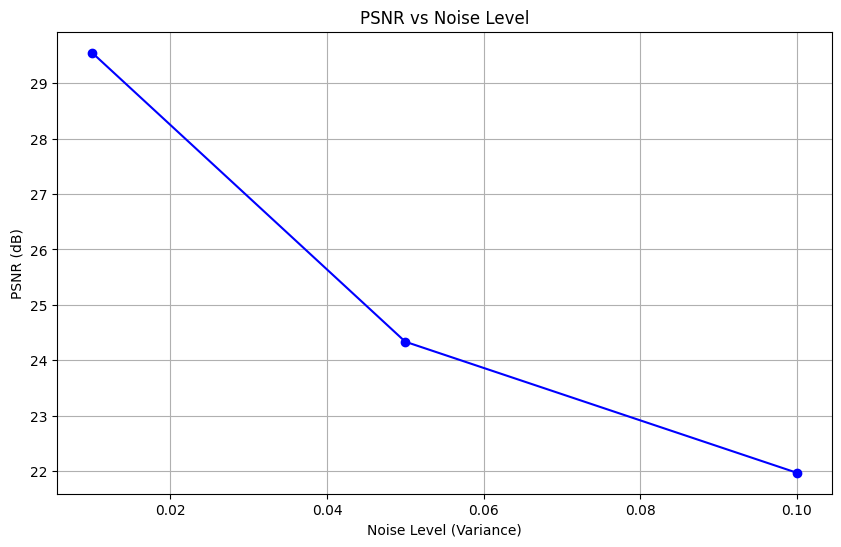

/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


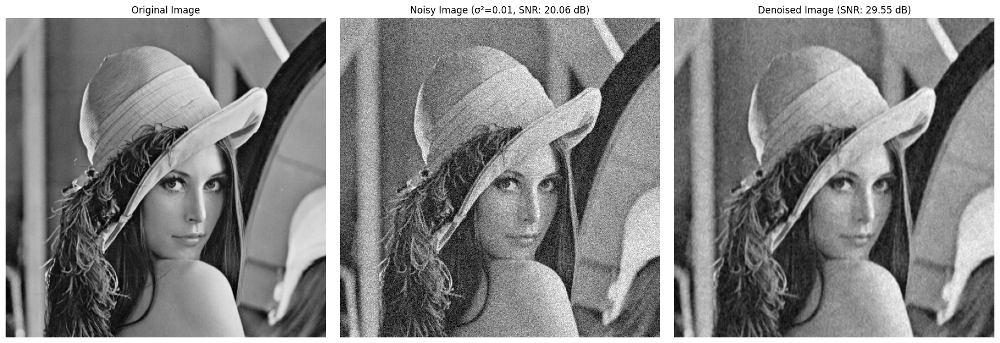

/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


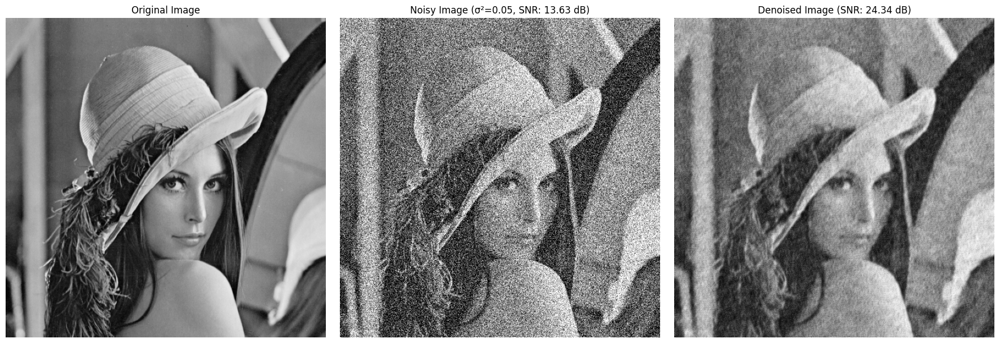

/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


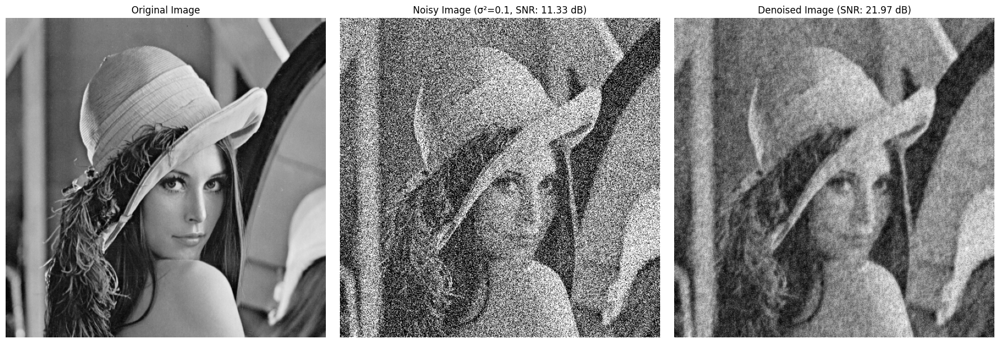

In [11]:
import matplotlib.pyplot as plt

# Extract data for visualization
noise_levels = [result[0] for result in all_results]
best_snrs = [result[1]['snr'] for result in all_results]

# PSNR Comparison Plot
plt.figure(figsize=(10, 6))
plt.plot(noise_levels, best_snrs, marker='o', linestyle='-', color='b')
plt.title('PSNR vs Noise Level')
plt.xlabel('Noise Level (Variance)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()

# Visualization of Reconstruction Performance
for noise_level, best_result in all_results:
    # Generate noisy and denoised images
    noisy_image = add_noise(image_original, noise_type='gaussian', var=noise_level)
    denoised_image = denoise_image(noisy_image, best_result['patch_size'], 
                                   best_result['dict_params'], best_result['sparse_params'])
    
    # Display images
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(image_original, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(noisy_image, cmap='gray')
    axes[1].set_title(f'Noisy Image (σ²={noise_level}, SNR: {peak_signal_noise_ratio(image_original, noisy_image):.2f} dB)')
    axes[1].axis('off')
    
    axes[2].imshow(denoised_image, cmap='gray')
    axes[2].set_title(f'Denoised Image (SNR: {best_result["snr"]:.2f} dB)')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()



Processing noise level: 0.01


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib

Grid search completed in 432.09 seconds
Best parameters:
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 29.55 dB


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


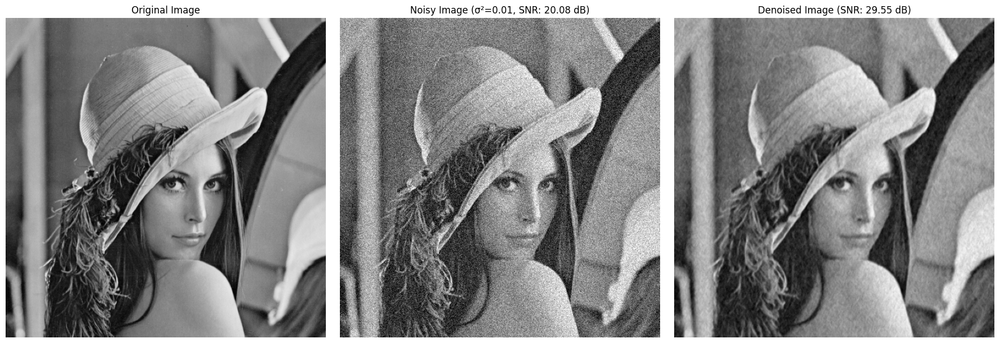


Processing noise level: 0.05


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib

Grid search completed in 349.85 seconds
Best parameters:
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 24.37 dB


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


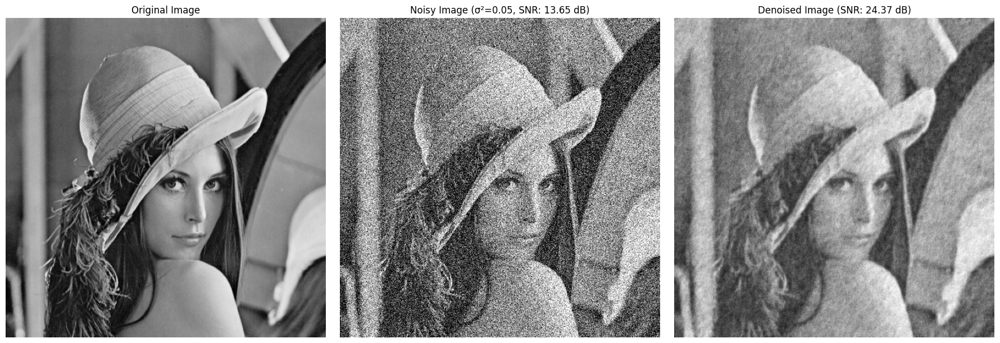


Processing noise level: 0.1


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(
/home/chucklab/.local/lib

Grid search completed in 231.20 seconds
Best parameters:
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 21.78 dB


/home/chucklab/.local/lib/python3.10/site-packages/sklearn/decomposition/_dict_learning.py:2243: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


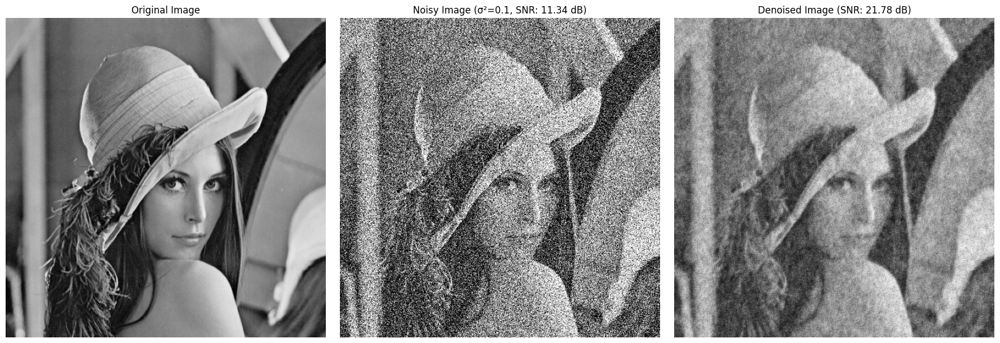

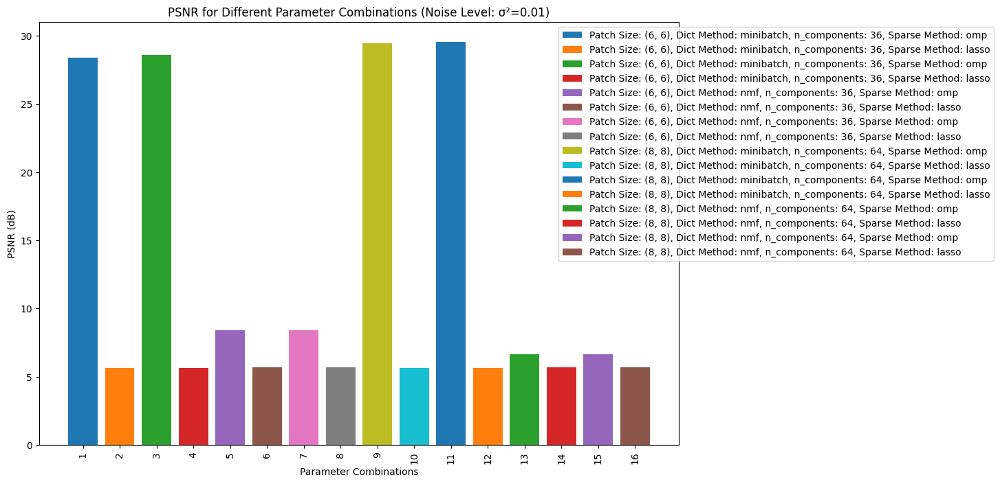

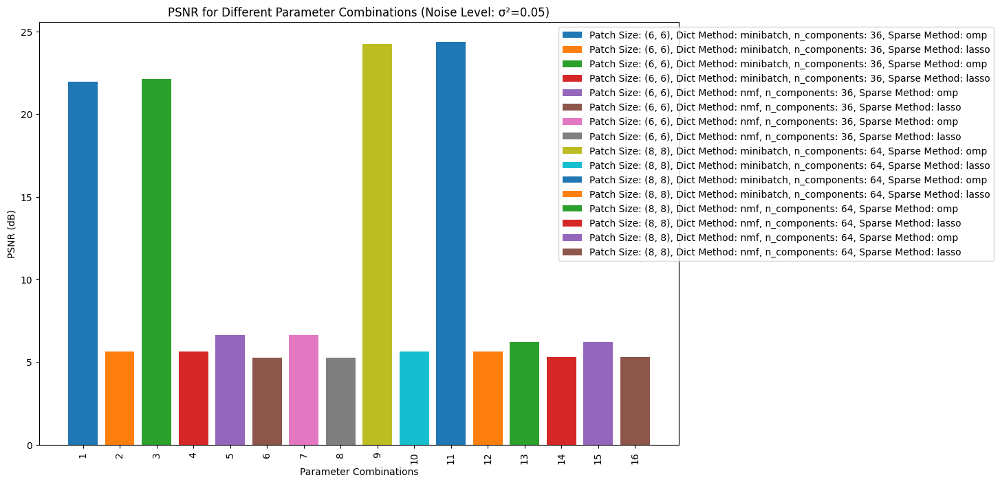

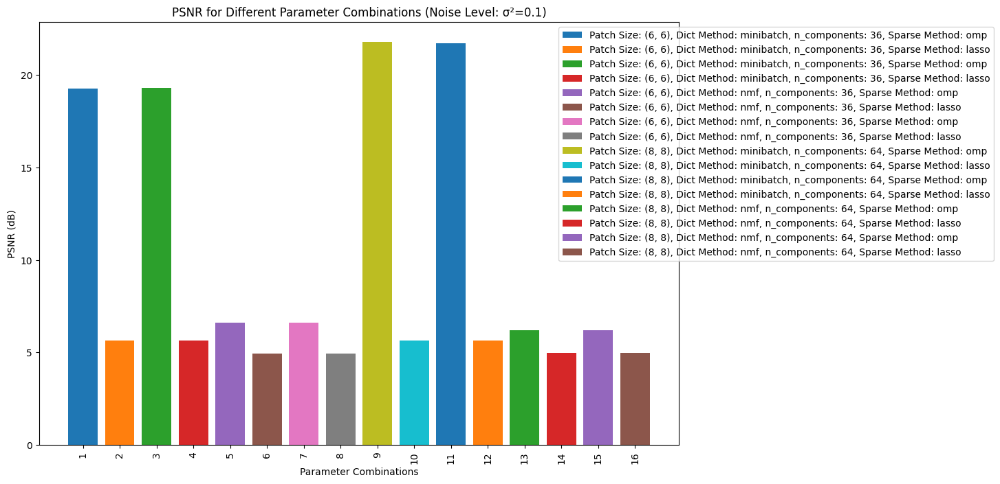


Overall best result:
Noise level: 0.01
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 29.55 dB


In [14]:
import matplotlib.pyplot as plt

# Store PSNR results for each parameter combination
all_psnr_results = []

for noise_level in noise_levels:
    print(f"\nProcessing noise level: {noise_level}")
    noisy_image = add_noise(image_original, noise_type='gaussian', var=noise_level)
    
    # Run grid search and store all results
    start_time = time.time()
    results = Parallel(n_jobs=-1)(delayed(evaluate_params)(noisy_image, image_original, *params) for params in param_combinations)
    end_time = time.time()
    
    # Store results for this noise level
    all_psnr_results.append((noise_level, results))
    
    # Find best parameters for this noise level
    valid_results = [r for r in results if r['snr'] != -np.inf]
    if valid_results:
        best_result = max(valid_results, key=lambda x: x['snr'])
        all_results.append((noise_level, best_result))
        
        print(f"Grid search completed in {end_time - start_time:.2f} seconds")
        print("Best parameters:")
        print(f"Patch Size: {best_result['patch_size']}")
        print(f"Dictionary Learning: {best_result['dict_params']}")
        print(f"Sparse Coding: {best_result['sparse_params']}")
        print(f"Best SNR: {best_result['snr']:.2f} dB")
        
        # Generate denoised image with best parameters
        denoised_image = denoise_image(noisy_image, best_result['patch_size'], 
                                       best_result['dict_params'], best_result['sparse_params'])
        
        # Display results
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(image_original, cmap='gray')
        axes[0].set_title('Original Image')
        axes[0].axis('off')
        axes[1].imshow(noisy_image, cmap='gray')
        axes[1].set_title(f'Noisy Image (σ²={noise_level}, SNR: {peak_signal_noise_ratio(image_original, noisy_image):.2f} dB)')
        axes[1].axis('off')
        axes[2].imshow(denoised_image, cmap='gray')
        axes[2].set_title(f'Denoised Image (SNR: {best_result["snr"]:.2f} dB)')
        axes[2].axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"No valid results found for noise level {noise_level}")

# Plot the PSNR results for each parameter combination
for noise_level, results in all_psnr_results:
    plt.figure(figsize=(12, 8))
    for i, result in enumerate(results):
        label = (f"Patch Size: {result['patch_size']}, "
                 f"Dict Method: {result['dict_params']['method']}, "
                 f"n_components: {result['dict_params']['n_components']}, "
                 f"Sparse Method: {result['sparse_params']['method']}")
        plt.bar(i, result['snr'], label=label)
    
    plt.xticks(range(len(results)), [f"{i+1}" for i in range(len(results))], rotation=90)
    plt.xlabel('Parameter Combinations')
    plt.ylabel('PSNR (dB)')
    plt.title(f'PSNR for Different Parameter Combinations (Noise Level: σ²={noise_level})')
    plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1))
    plt.show()

# Print overall best result
if all_results:
    overall_best = max(all_results, key=lambda x: x[1]['snr'])
    print("\nOverall best result:")
    print(f"Noise level: {overall_best[0]}")
    print(f"Patch Size: {overall_best[1]['patch_size']}")
    print(f"Dictionary Learning: {overall_best[1]['dict_params']}")
    print(f"Sparse Coding: {overall_best[1]['sparse_params']}")
    print(f"Best SNR: {overall_best[1]['snr']:.2f} dB")
else:
    print("No valid results found across all noise levels")


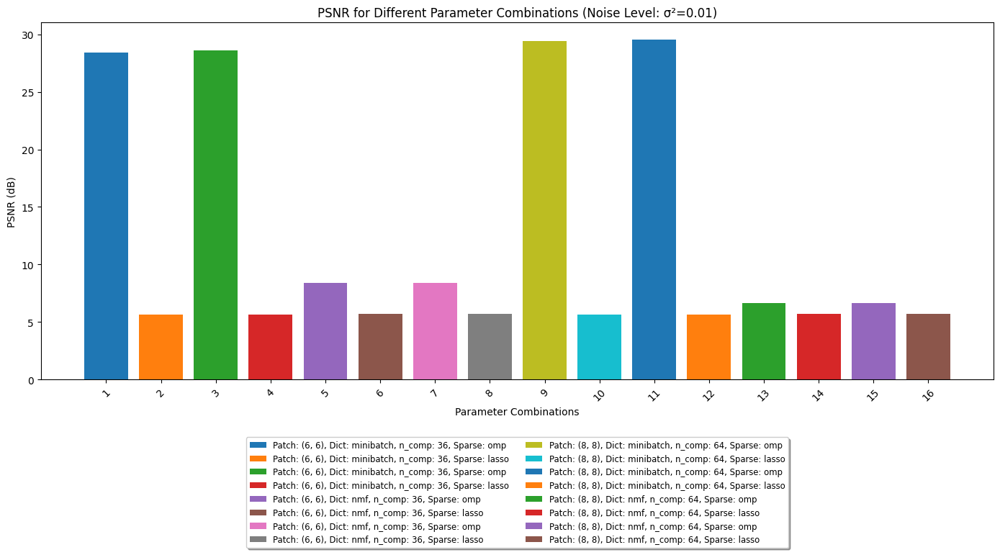

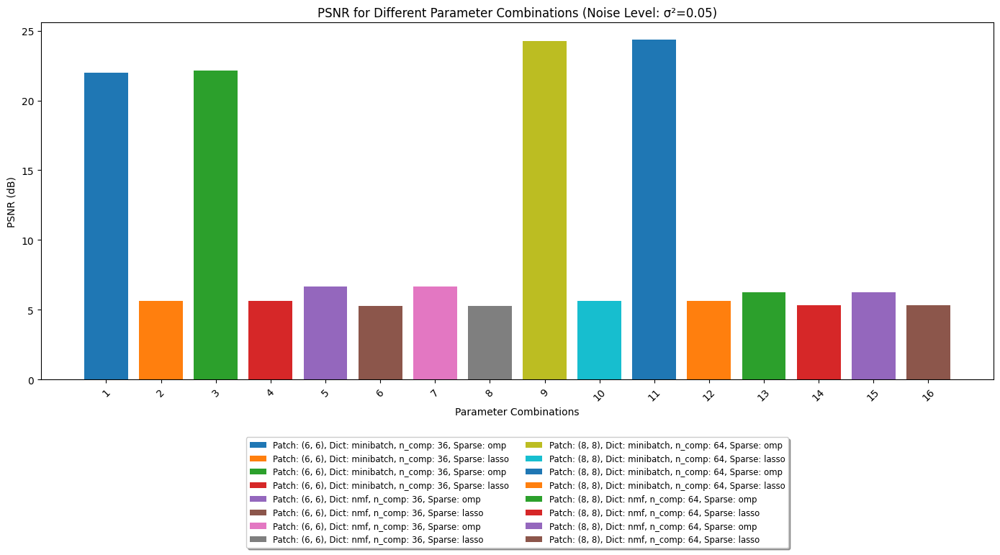

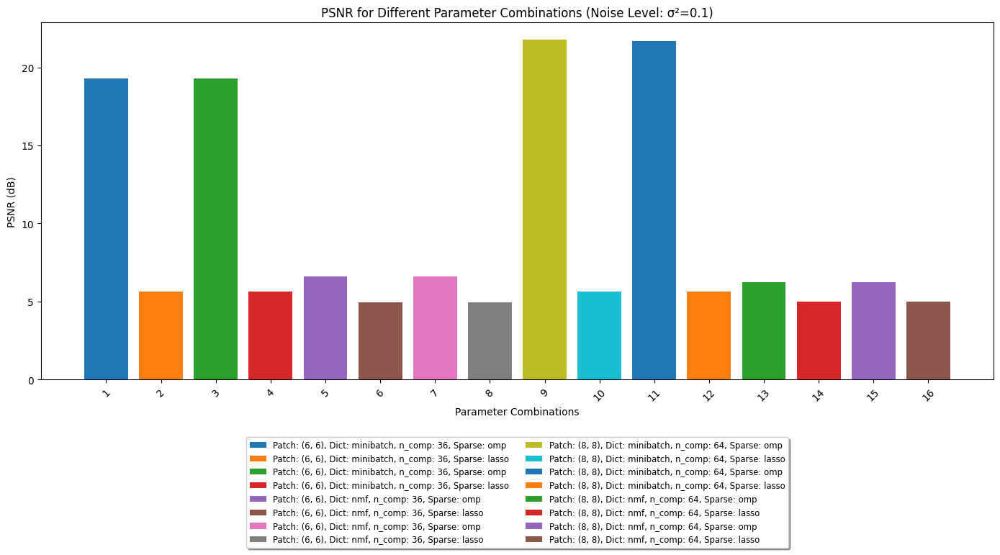


Overall best result:
Noise level: 0.01
Patch Size: (8, 8)
Dictionary Learning: {'method': 'minibatch', 'n_components': 64}
Sparse Coding: {'method': 'omp', 'n_nonzero_coefs': 3}
Best SNR: 29.55 dB


In [18]:
import matplotlib.pyplot as plt

# Plot the PSNR results for each parameter combination
for noise_level, results in all_psnr_results:
    plt.figure(figsize=(14, 8))
    
    bars = []
    labels = []
    
    for i, result in enumerate(results):
        bars.append(plt.bar(i, result['snr']))
        labels.append((f"Patch: {result['patch_size']}, "
                       f"Dict: {result['dict_params']['method']}, "
                       f"n_comp: {result['dict_params']['n_components']}, "
                       f"Sparse: {result['sparse_params']['method']}"))
    
    plt.xticks(range(len(results)), [f"{i+1}" for i in range(len(results))], rotation=45)
    plt.xlabel('Parameter Combinations')
    plt.ylabel('PSNR (dB)')
    plt.title(f'PSNR for Different Parameter Combinations (Noise Level: σ²={noise_level})')
    
    # Custom legend
    plt.legend(bars, labels, loc='upper center', bbox_to_anchor=(0.5, -0.15),
               fancybox=True, shadow=True, ncol=2, fontsize='small')
    
    plt.tight_layout()
    plt.show()

# Print overall best result
if all_results:
    overall_best = max(all_results, key=lambda x: x[1]['snr'])
    print("\nOverall best result:")
    print(f"Noise level: {overall_best[0]}")
    print(f"Patch Size: {overall_best[1]['patch_size']}")
    print(f"Dictionary Learning: {overall_best[1]['dict_params']}")
    print(f"Sparse Coding: {overall_best[1]['sparse_params']}")
    print(f"Best SNR: {overall_best[1]['snr']:.2f} dB")
else:
    print("No valid results found across all noise levels")
